# 필요 모듈 가져오기

In [2]:
from tensorflow import keras
from keras.models import load_model
from sklearn.metrics import f1_score
import pandas as pd
import numpy as np


from Preprocessing import make_user_df, make_label_df
from datasplit import split
from SP_Model import MRCnnModel
from GpsVS import get_gps, diplay_SP

# 데이터 불러오기

In [ ]:
path = "D:\\23" # 필요에 맞춰 바꾸기

In [ ]:
e4_df = make_user_df(path, duplicated = False #ex) ./user01-06/user01-06 이런식으로 중복된 경우는 True, 아닌 경우는 False
                    )

100%|████████████████████████████████████████████████████████████████████████████████| 5/5 [4:59:03<00:00, 3588.64s/it]


In [ ]:
label_df = make_label_df(path, duplicated = False #ex) ./user01-06/user01-06 이런식으로 중복된 경우는 True, 아닌 경우는 False
                    )

100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:23<00:00,  4.66s/it]


In [ ]:
e4_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 18969600 entries, 27 to 19218720
Data columns (total 10 columns):
 #   Column           Dtype  
---  ------           -----  
 0   timestamp        float64
 1   e4Temp_temp      float64
 2   user             object 
 3   timestamp_large  int32  
 4   e4Hr_hr          float64
 5   e4Eda_eda        float64
 6   e4Bvp_value      float64
 7   e4Acc_x          float64
 8   e4Acc_y          float64
 9   e4Acc_z          float64
dtypes: float64(8), int32(1), object(1)
memory usage: 1.5+ GB


In [ ]:
e4_df.head()

,timestamp,e4Temp_temp,user,timestamp_large,e4Hr_hr,e4Eda_eda,e4Bvp_value,e4Acc_x,e4Acc_y,e4Acc_z
27,0.0,34.03,user01,1598833320,92.93,0.470662,-33.452656,-0.510742,-0.223633,0.727539
28,1.0,34.00,user01,1598833320,92.62,0.447930,-41.560156,-0.087402,-0.750488,0.455078
29,2.0,33.99,user01,1598833320,92.33,0.420075,42.538906,-0.949707,-0.159668,-0.377441
30,3.0,34.00,user01,1598833320,92.26,0.431281,-146.084062,-0.752930,-0.024414,0.459961
31,4.0,34.00,user01,1598833320,92.19,0.415272,229.621563,-0.835449,0.075684,-0.386719


In [ ]:
label_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 440830 entries, 0 to 754
Data columns (total 14 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   ts                   440830 non-null  float64
 1   action               440830 non-null  object 
 2   actionOption         440830 non-null  int64  
 3   actionSub            95860 non-null   object 
 4   actionSubOption      95860 non-null   float64
 5   condition            440830 non-null  object 
 6   conditionSub1Option  207576 non-null  float64
 7   conditionSub2Option  207576 non-null  float64
 8   place                440830 non-null  object 
 9   emotionPositive      440830 non-null  int64  
 10  emotionTension       440830 non-null  int64  
 11  activity             440830 non-null  int64  
 12  user                 440830 non-null  object 
 13  timestamp            440830 non-null  int32  
dtypes: float64(4), int32(1), int64(4), object(5)
memory usage: 48.8+ MB


In [ ]:
label_df.head()

,ts,action,actionOption,actionSub,actionSubOption,condition,conditionSub1Option,conditionSub2Option,place,emotionPositive,emotionTension,activity,user,timestamp
0,1.598760e+09,work,212,NaN,NaN,WITH_MANY,4.0,3.0,other_indoor,5,7,3,user01,1598759880
1,1.598760e+09,work,212,NaN,NaN,WITH_MANY,4.0,3.0,other_indoor,5,7,3,user01,1598759880
2,1.598760e+09,work,212,NaN,NaN,WITH_MANY,4.0,3.0,other_indoor,5,7,3,user01,1598759880
3,1.598760e+09,work,212,NaN,NaN,WITH_MANY,4.0,3.0,other_indoor,5,7,3,user01,1598759880
4,1.598760e+09,work,212,NaN,NaN,WITH_MANY,4.0,3.0,other_indoor,5,7,3,user01,1598759880


# 데이터 분할

In [ ]:
x_train, x_valid, x_test, x_visual, y_train, y_valid, y_test, visual_target = split(e4_df, label_df, "user25", seed1 = 42, seed2 = 42)

In [ ]:
print("x_train :",x_train.shape)
print("x_valid :",x_valid.shape)
print("x_test :",x_test.shape)
print("x_visual :",x_visual.shape)
print("y_train :",y_train.shape)
print("y_valid :",y_valid.shape)
print("y_test :",y_test.shape)
print("visual_target :",visual_target.shape)

x_train : (205246, 60, 7)
x_valid : (29321, 60, 7)
x_test : (58642, 60, 7)
x_visual : (19353, 60, 7)
y_train : (205246,)
y_valid : (29321,)
y_test : (58642,)
visual_target : (19353, 3)


# 모델링

## 모델 정의

In [13]:
model = MRCnnModel()

In [10]:
encoded_y_train = model.Encode(y_train)
encoded_y_valid = model.Encode(y_valid)

## 모델 학습

Epoch 1/1000
3207/3207 [==============================] - ETA: 0s - loss: 1.2808 - accuracy: 0.4613
Epoch 1: val_loss improved from inf to 1.37139, saving model to ./model_checkpoint.h5
3207/3207 [==============================] - 54s 12ms/step - loss: 1.2808 - accuracy: 0.4613 - val_loss: 1.3714 - val_accuracy: 0.4120 - lr: 0.0010
Epoch 2/1000
3203/3207 [============================>.] - ETA: 0s - loss: 1.2167 - accuracy: 0.4981
Epoch 2: val_loss did not improve from 1.37139
3207/3207 [==============================] - 38s 12ms/step - loss: 1.2167 - accuracy: 0.4981 - val_loss: 1.3912 - val_accuracy: 0.4024 - lr: 0.0010
Epoch 3/1000
3204/3207 [============================>.] - ETA: 0s - loss: 1.1861 - accuracy: 0.5155
Epoch 3: val_loss improved from 1.37139 to 1.25353, saving model to ./model_checkpoint.h5
3207/3207 [==============================] - 39s 12ms/step - loss: 1.1861 - accuracy: 0.5155 - val_loss: 1.2535 - val_accuracy: 0.4843 - lr: 0.0010
Epoch 4/1000
3205/3207 [=========

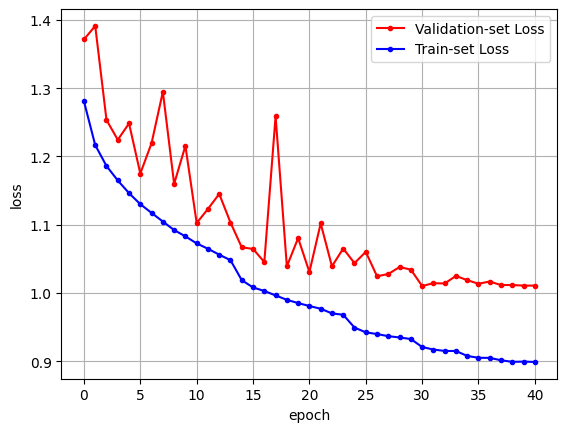

In [ ]:
model.fit(x_train, encoded_y_train ,x_valid, encoded_y_valid, epochsize = 1000, savename = "model_cnn") #model_cnn.h5 생성됨ㅡ

## 학습 결과 확인

In [ ]:
print(f1_score(model.predict(x_test), y_test, average = "weighted"))

1833/1833 [==============================] - 7s 3ms/step
0.6164323794246757


In [ ]:
print(f1_score(model.predict(x_test), y_test, average = "micro"))

1833/1833 [==============================] - 5s 3ms/step
0.6037311142184782


# 사후분석

In [ ]:
index_25 = model.make_SP_ts(x_visual, visual_target, where = "other_indoor") #where 옵션 : "other_indoor" 기본값, 실제 장소 판단 변경 가능

605/605 [==============================] - 2s 3ms/step


In [ ]:
print(index_25[:5])

21    1598935920
22    1598935980
23    1598936040
24    1598936100
25    1598936160
Name: timestamp_large, dtype: int64


In [3]:
df_gps = get_gps(path, "user21-25", "user25",#duplicated = True #ex) ./user01-06/user01-06 이런식으로 중복된 경우는 True, 아닌 경우는 False
                    )

100%|██████████████████████████████████████████████████████████████████████████████████| 27/27 [03:53<00:00,  8.66s/it]


In [6]:
diplay_SP(df_gps, index_25, make_html = True) #True : map.html 생성됨